# Machine Learning (and Deep Learning) in just over 200 minutes with R
Created by [Ajay Hemanth](https://www.linkedin.com/in/ajayhemanth/?originalSubdomain=au) with [Yoni Nazarathy](https://yoninazarathy.com/). 

See more material at the [workshop's GitHub page](https://github.com/ajayhemanth/Machine-Learning-Workshop).

--- 

# Activity A: Linear Classifiers
---

# Least Squares

$$
\min_\beta ||A\beta - y||^2
$$

Here $A$ is the design matrix. It is a $n \times (p+1)$ matrix where each column is a feature and each row is an observation.

$$
A = 
\left[
\begin{matrix}
1 & x_1^1 & x_2^1 & \cdots & x_p^1 \\
1 & x_1^2 & x_2^2 & \cdots & x_p^2\\
\vdots & \vdots & \vdots && \vdots\\
1 & x_1^n & x_2^n & \cdots & x_p^n\\
\end{matrix}
\right]
$$

In [1]:
# ordinary least squares is used to find linear coefficients with help of iris dataset.

# "Sepal.Length" and "Petal.Width" columns are used to predict "Petal.Length"
A = iris[ , c("Sepal.Length", "Petal.Width") ]

# 1s is used as column for the intercept coefficient
A[ , 'intercept'] = 1

In [2]:
Y = iris[ , "Petal.Length" ]

In [3]:
A = as.matrix(A)
Y = as.matrix(Y)

For statisticians, solving the least squares is usaully via

$$
\hat{\beta} = A^\dagger y
$$

where $A^\dagger$ is the pseudoinverse.

The pseudoinverse is $A^\dagger = (A^\top A) ^{-1} A^\top$ when $A$ is full rank, otherwsie it is also defined.

In [4]:
ols1 = ( solve( t(A) %*% A ) %*% t(A) ) %*% Y
ols1

# comparing it with lm function
lm(Petal.Length ~ Sepal.Length + Petal.Width, data=iris)

Sepal.Length,0.5422556
Petal.Width,1.7481029
intercept,-1.5071384



Call:
lm(formula = Petal.Length ~ Sepal.Length + Petal.Width, data = iris)

Coefficients:
 (Intercept)  Sepal.Length   Petal.Width  
     -1.5071        0.5423        1.7481  


## Gradient Descent

$$
\nabla(\beta) = 2 A^\top(A \beta - y).
$$

In [5]:
lr = 0.0001  # learning rate
b = runif(3) # random starting points for beta
bh = t(b) # bh stores value of betas for each iteration
for (i in 1:100000) {
    gradient = 2 * t(A) %*% ( (A %*% b) - Y ) # calculate gradient
    b = b - lr * gradient # update beta
    bh = rbind(bh, t(b)) # store beta to bh
    if(i%%100 == 0){
        cat(".")
        flush.console()
    }
}
b

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Sepal.Length,0.5422556
Petal.Width,1.7481029
intercept,-1.5071384


### Calculating Error for each combination of $\beta$ through gradient descent

Calculating $\sum (\hat{y}-y)^2 $ for each $\beta$ combination of gradient descent.

In [6]:
error = colSums((A %*% t(bh) - as.vector(Y))^2)

In [7]:
# plotting the coefficients (in the 3 axes) - with error as color

gradientData = data.frame(bh, error=error)

library('plotly')
fig <- plot_ly(gradientData, x = ~Sepal.Length, y = ~Petal.Width, z = ~intercept, type = 'scatter3d', mode = 'lines',
        opacity = 1, line = list(width = 6, color = ~error, reverscale = FALSE))
fig

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




HTML widgets cannot be represented in plain text (need html)

## Now the discussion goes into MNIST
MNIST contain 28 X 28 pixels hand-written digits like the below.<br>
$28\times 28 = 784$ features 

<div>
<img src="img/MNIST.png" width="200" align="center"/>
</div>

In [8]:
library('keras')
library('MASS') # package to calculate pseudo inverse


Attaching package: ‘MASS’


The following object is masked from ‘package:plotly’:

    select




#####  ** Participants who are facing issues with "Keras" please uncomment the next cell **

In [9]:
# to_categorical = function(y) {
#     A = matrix(nrow=length(y),ncol=max(y)+1)
#     for(i in 0:max(y)) {
#         A[,i+1] = (y==i)*1
#     }
#     return(A)
# }


# dataset_mnist = function() {
#     return(readRDS(file="dataset/mnist.rds"))
# }

# array_reshape = function(x) {
#     if(dim(x)[1]==60000) {
#         return(readRDS(file="dataset/train.rds"))
#     } else {
#         return(readRDS(file="dataset/test.rds"))
#     }
# }

# array_reshape = function(x,dim) {
#     if(dim(x)[1]==60000) {
#         return(readRDS(file="dataset/train.rds"))
#     } else {
#         return(readRDS(file="dataset/test.rds"))
#     }
# }

In [10]:
mnist <- dataset_mnist() # loading data -- function present in keras package

mnist dataset contains a training set and a test set.<br>
"$x$" and "$y$" are explanatory and response variables in each set.

In [11]:
str(mnist)

List of 2
 $ train:List of 2
  ..$ x: int [1:60000, 1:28, 1:28] 0 0 0 0 0 0 0 0 0 0 ...
  ..$ y: int [1:60000(1d)] 5 0 4 1 9 2 1 3 1 4 ...
 $ test :List of 2
  ..$ x: int [1:10000, 1:28, 1:28] 0 0 0 0 0 0 0 0 0 0 ...
  ..$ y: int [1:10000(1d)] 7 2 1 0 4 1 4 9 5 9 ...


In [12]:
mnist$train$x[1,,]

0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,175,26,166,255,247,127,0,0,0,0
0,0,0,0,0,0,0,0,30,36,⋯,225,172,253,242,195,64,0,0,0,0
0,0,0,0,0,0,0,49,238,253,⋯,93,82,82,56,39,0,0,0,0,0
0,0,0,0,0,0,0,18,219,253,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,80,156,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,14,⋯,0,0,0,0,0,0,0,0,0,0


#### Plotting the 1st digit of MNIST

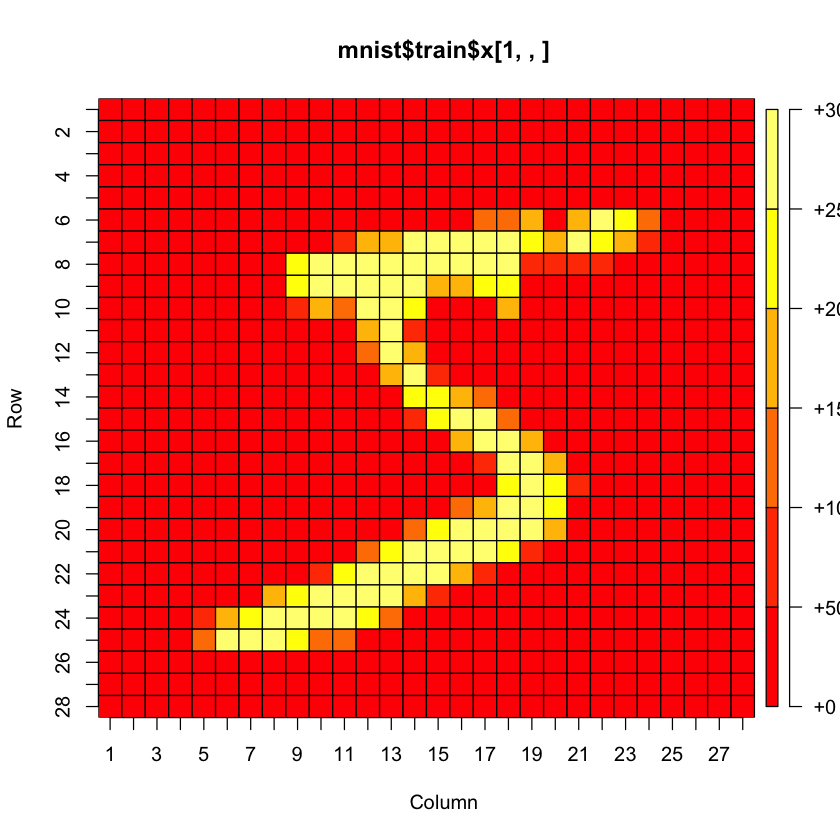

In [13]:
library("plot.matrix")
plot(mnist$train$x[1,,])

In [14]:
# flattening 28 X 28 pixels
A <- array_reshape( mnist$train$x, c(dim(mnist$train$x)[1], 784) )
dim(A)
head(A)

[1] 60000   784

0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [15]:
# adding 1s as a feature for the intercept term
A = cbind(matrix(rep(1, nrow(A))), A)
dim(A)
head(A)

[1] 60000   785

1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [16]:
# The response variable is the digit number varying from 0 to 9.
table(mnist$train$y)


   0    1    2    3    4    5    6    7    8    9 
5923 6742 5958 6131 5842 5421 5918 6265 5851 5949 

In [17]:
# to_categorical function is used to create binary matrix from categorical data.
# However it requires the categorical data to be numbered starting from 0. else it will create '0' columns for number from 0 until the minimum value of categorical column.
to_categorical(0:2)
to_categorical(1:3)

1,0,0
0,1,0
0,0,1


0,1,0,0
0,0,1,0
0,0,0,1


In [18]:
# converting the response column to binary class matrix
Y = to_categorical(mnist$train$y) 
dim(Y)
head(Y)

[1] 60000    10

0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0
0,0,0,0,1,0,0,0,0,0
0,1,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,1
0,0,1,0,0,0,0,0,0,0


In [19]:
# optional - replacing 0 with -1
Y[Y==0] = -1
dim(Y)
head(Y)

[1] 60000    10

-1,-1,-1,-1,-1,1,-1,-1,-1,-1
1,-1,-1,-1,-1,-1,-1,-1,-1,-1
-1,-1,-1,-1,1,-1,-1,-1,-1,-1
-1,1,-1,-1,-1,-1,-1,-1,-1,-1
-1,-1,-1,-1,-1,-1,-1,-1,-1,1
-1,-1,1,-1,-1,-1,-1,-1,-1,-1


$$
\hat{\beta} = A^\dagger y
$$

where $A^\dagger$ is the pseudoinverse.

In [20]:
#We can restrict the training size if we wish...
n_train = 1000 #use 60000 for full data if you wish

In [21]:
# This may take about two minutes for the whole 60,000 observation dataset 
pseudoInv = ginv(A[1:n_train,])

In [22]:
b = pseudoInv %*% Y[1:n_train,]
dim(b)

[1] 785  10

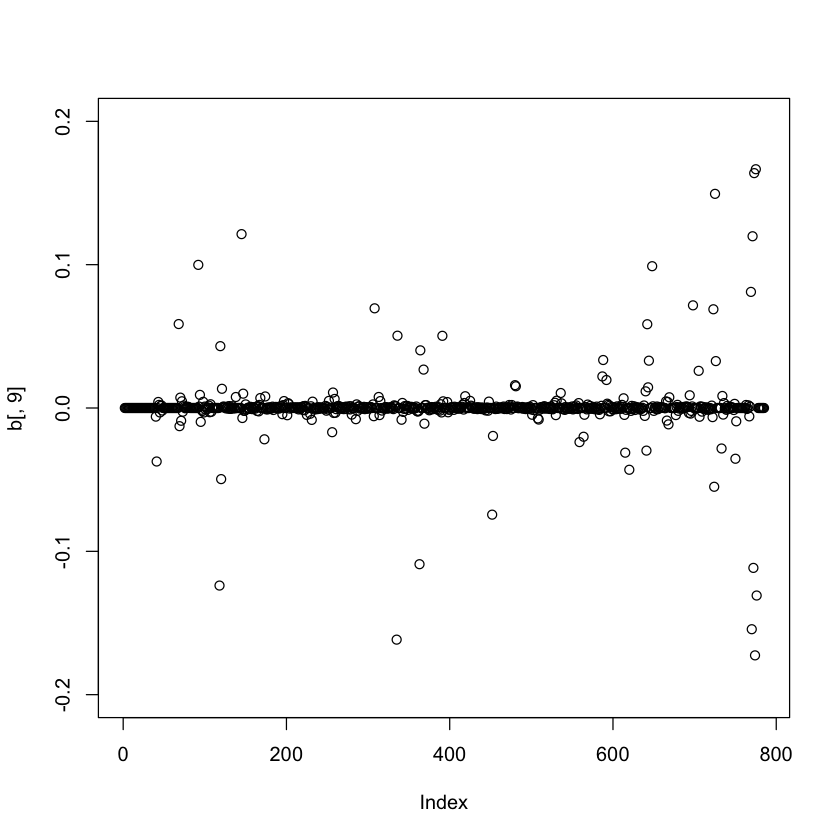

In [23]:
plot(b[,9], ylim=c(-.2,.2))

$$
\hat{y} = A \hat{\beta}
$$


In [24]:
pred = A[1:n_train,] %*% b
dim(pred)
head(pred)

[1] 1000   10

-0.9801110,-1.0614140,-0.8961884,-0.7548679,-1.0469917,0.5934403,-0.9587571,-0.8440589,-1.0258341,-1.0252171
0.6466119,-0.9350316,-1.0321566,-1.0402391,-1.1700163,-1.0414769,-0.8348642,-1.0343597,-0.8770700,-0.6813975
-0.9865600,-0.9814258,-0.9371730,-1.0463440,0.9505489,-0.9619163,-1.0536998,-0.9567115,-0.9186208,-1.1080978
-0.9686505,0.8845104,-0.7526760,-0.9811926,-0.8054706,-1.1618847,-0.9656873,-1.2963505,-0.9335886,-1.0190095
-1.0207018,-1.2030675,-0.9472736,-1.1381476,-0.7812705,-1.0239159,-1.2583988,-1.0202061,-0.6441399,1.0371218
-0.7155934,-1.0606325,0.9933614,-1.4370229,-0.9277105,-0.9048449,-1.0983745,-1.1349954,-0.9898449,-0.7243425


In [25]:
# "pred" is a number proportional to the possibility of an instance belonging to a digit. 
# we classify the instance into that class which is maximum 
table(mnist$train$y[1:n_train], apply(pred, 1, which.max)-1)   #  confusion matrix
mean(mnist$train$y[1:n_train] == apply(pred, 1, which.max)-1)  #  train accuracy

   
      0   1   2   3   4   5   6   7   8   9
  0  97   0   0   0   0   0   0   0   0   0
  1   0 116   0   0   0   0   0   0   0   0
  2   0   0  99   0   0   0   0   0   0   0
  3   0   0   0  93   0   0   0   0   0   0
  4   0   0   0   0 105   0   0   0   0   0
  5   0   0   0   0   0  92   0   0   0   0
  6   0   0   0   0   0   0  94   0   0   0
  7   0   1   0   0   0   0   0 116   0   0
  8   0   2   0   0   0   0   0   0  85   0
  9   0   0   0   0   0   0   0   0   0 100

[1] 0.997

### Test accuracy

In [26]:
# redoing the same steps to calculate test error
Atest <- array_reshape( mnist$test$x, c(dim(mnist$test$x)[1], 784) )
Atest = cbind(matrix(rep(1, nrow(Atest))), Atest)
pred = Atest %*% b

table(mnist$test$y, apply(pred, 1, which.max)-1)
mean(mnist$test$y == apply(pred, 1, which.max)-1)

   
       0    1    2    3    4    5    6    7    8    9
  0  778   11   17   20   23   56   20   19   15   21
  1    2 1087    4    2    9    6    4    1   15    5
  2   67  115  407   46   63   47  116   73   61   37
  3   35   69   25  501   47  124   17   55   56   81
  4    5   32   18   28  662   20   21   23   17  156
  5   39   24   25   66   47  528   17   22   57   67
  6   41   62   57   34   59   72  571   13   14   35
  7    6   41   17   28   40    8    3  686   12  187
  8   32   73   45   46   55  125   26   28  450   94
  9   15   13   16   46  105   30    7  136   31  610

[1] 0.628

#### Create a function which takes as argument an image, and returns the digit predicted using the trained $\beta$

In [27]:
myClassifier = function(img) {

    # convert img to vector
    A <- matrix(as.vector(t(img)),nrow=1)#array_reshape( as.vector(img[1,,]), c(1, 784) )
    
    # append intercept
    A = cbind(matrix(rep(1, nrow(A))), A)

    # multiply by trained weights
    pred = A %*% b
    
    # choose which max
    predDigit = apply(pred, 1, which.max)-1
    
    return(predDigit)

}

In [33]:
# predicting a digit using the classifier udf
index_to_check = 1
myClassifier(mnist$train$x[index_to_check,,])
mnist$train$y[index_to_check]

[1] 5

[1] 5

### MNIST Prediction using Gradient Descent 

In [34]:
test_acc <- function(b){
    Atest <- array_reshape( mnist$test$x, c(dim(mnist$test$x)[1], 784) )
    Atest = cbind(matrix(rep(1, nrow(Atest))), Atest)
    pred = Atest %*% b

    table(mnist$test$y, apply(pred, 1, which.max)-1)
    mean(mnist$test$y == apply(pred, 1, which.max)-1)
}

In [ ]:
set.seed(0)
lr = 0.000000001 
b = matrix(runif(ncol(A)*ncol(Y)), ncol=ncol(Y)) ;
for (i in 1:100000) {
    gradient = 2 * t(A) %*% ( (A %*% b) - Y )
    b = b - lr * gradient
    if(i%%1000 == 0){
        print(c(norm(lr*gradient),test_acc(b)))
        flush.console()
    }
}